# This script includes: 

## 1. Import libraries
## 2. Import data
## 3. Create random forest model on all stations for one decade
    3.1 Filter to only one decade (2010's)
    3.2 Create random forest
    3.3 Model accuracy
    3.4 Plot a few single decision trees
    3.5 Feature importance
## 4. Random forest on every year with top 3 most influential weather stations
    4.1 Create separate DataFrames for specific weather stations based on column names.
    4.2 Maastricht
    4.2 Dusseldorf
    4.3 Basel

## 1. Import libraries

In [3]:
# Import libraries
import pandas as pd
import numpy as np
import seaborn as sns
import os
import operator
import datetime
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn import datasets  
from sklearn.ensemble import RandomForestClassifier
from numpy import argmax
from sklearn import metrics  
from sklearn.tree import plot_tree
from sklearn import tree
from sklearn.metrics import classification_report, accuracy_score
from sklearn.model_selection import train_test_split

## 2. Import data

In [5]:
# Import data

path = r'C:\Users\ashle\Documents\10-2024 Climate Analysis'

df_weather = pd.read_csv(os.path.join(path, '02 Data Sets', 'X_weather_data_cleaned_preprocessed.csv'),index_col = False) 
df_unscaled = pd.read_csv(os.path.join(path, '02 Data Sets', 'Dataset-weather-prediction-dataset-processed.csv'),index_col = False) 
df_pleasant = pd.read_csv(os.path.join(path, '02 Data Sets', 'Dataset-Answers-Weather_Prediction_Pleasant_Weather.csv'),index_col = False)

## 3. Random forest model on all stations for one decade

In [7]:
df_weather.head()

,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,BELGRADE_cloud_cover,...,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,7,0.85,1.018,0.32,0.09,0.7,6.5,0.8,10.9,1,...,4.9,5,0.88,1.0003,0.45,0.34,4.7,8.5,6.0,10.9
1,6,0.84,1.018,0.36,1.05,1.1,6.1,3.3,10.1,6,...,5.0,7,0.91,1.0007,0.25,0.84,0.7,8.9,5.6,12.1
2,8,0.90,1.018,0.18,0.30,0.0,8.5,5.1,9.9,6,...,4.1,7,0.91,1.0096,0.17,0.08,0.1,10.5,8.1,12.9
3,3,0.92,1.018,0.58,0.00,4.1,6.3,3.8,10.6,8,...,2.3,7,0.86,1.0184,0.13,0.98,0.0,7.4,7.3,10.6
4,6,0.95,1.018,0.65,0.14,5.4,3.0,-0.7,6.0,8,...,4.3,3,0.80,1.0328,0.46,0.00,5.7,5.7,3.0,8.4


In [8]:
df_pleasant.head()

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
0,19600101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,19600102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,19600103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,19600104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,19600105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [9]:
df_unscaled.head()

,DATE,MONTH,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,...,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_snow_depth,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,19600101,1,7,2.1,0.85,1.018,0.32,0.09,0,0.7,...,5,0.88,1.0003,0.45,0.34,0,4.7,8.5,6.0,10.9
1,19600102,1,6,2.1,0.84,1.018,0.36,1.05,0,1.1,...,7,0.91,1.0007,0.25,0.84,0,0.7,8.9,5.6,12.1
2,19600103,1,8,2.1,0.90,1.018,0.18,0.30,0,0.0,...,7,0.91,1.0096,0.17,0.08,0,0.1,10.5,8.1,12.9
3,19600104,1,3,2.1,0.92,1.018,0.58,0.00,0,4.1,...,7,0.86,1.0184,0.13,0.98,0,0.0,7.4,7.3,10.6
4,19600105,1,6,2.1,0.95,1.018,0.65,0.14,0,5.4,...,3,0.80,1.0328,0.46,0.00,0,5.7,5.7,3.0,8.4


In [10]:
# Add 'DATE' column back to the cleaned/preprocessed weather data (in order to filter to only one decade)
df_weather.insert(0, 'DATE', df_unscaled['DATE'])

In [11]:
# Convert 'DATE' to datetime format
df_weather['DATE'] = pd.to_datetime(df_weather['DATE'], format='%Y%m%d')
df_pleasant['DATE'] = pd.to_datetime(df_pleasant['DATE'], format='%Y%m%d')

In [12]:
df_weather.head()

,DATE,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,...,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,1960-01-01,7,0.85,1.018,0.32,0.09,0.7,6.5,0.8,10.9,...,4.9,5,0.88,1.0003,0.45,0.34,4.7,8.5,6.0,10.9
1,1960-01-02,6,0.84,1.018,0.36,1.05,1.1,6.1,3.3,10.1,...,5.0,7,0.91,1.0007,0.25,0.84,0.7,8.9,5.6,12.1
2,1960-01-03,8,0.90,1.018,0.18,0.30,0.0,8.5,5.1,9.9,...,4.1,7,0.91,1.0096,0.17,0.08,0.1,10.5,8.1,12.9
3,1960-01-04,3,0.92,1.018,0.58,0.00,4.1,6.3,3.8,10.6,...,2.3,7,0.86,1.0184,0.13,0.98,0.0,7.4,7.3,10.6
4,1960-01-05,6,0.95,1.018,0.65,0.14,5.4,3.0,-0.7,6.0,...,4.3,3,0.80,1.0328,0.46,0.00,5.7,5.7,3.0,8.4


In [13]:
df_pleasant.head()

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
0,1960-01-01,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1960-01-02,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1960-01-03,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,1960-01-04,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1960-01-05,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


### 3.1 Filter to only one decade (2010's)

In [15]:
# Create a dataframe with only one decade (2010s) on weather data
df_weather_decade = df_weather[
    (df_weather['DATE'] >= datetime.datetime(2010, 1, 1)) & 
    (df_weather['DATE'] < datetime.datetime(2020, 1, 1))
]

# Create a dataframe with only one decade (2010s) on pleasant data
df_pleasant_decade = df_pleasant[
    (df_pleasant['DATE'] >= datetime.datetime(2010, 1, 1)) & 
    (df_pleasant['DATE'] < datetime.datetime(2020, 1, 1))
]

In [16]:
df_weather_decade.head()

,DATE,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,...,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
18263,2010-01-01,8,0.93,0.9965,0.18,0.56,0.0,2.9,-0.2,4.8,...,-7.0,1,0.80,1.0121,0.43,0.00,6.0,1.7,-1.6,5.0
18264,2010-01-02,3,0.74,1.0193,0.58,0.00,5.2,-1.5,-4.2,0.4,...,-7.1,1,0.82,1.0196,0.45,0.00,6.0,0.8,-4.5,6.2
18265,2010-01-03,3,0.75,1.0226,0.61,0.00,6.3,-3.2,-6.0,1.1,...,-7.1,4,0.71,1.0196,0.36,0.41,1.6,0.5,-4.1,5.1
18266,2010-01-04,5,0.83,1.0169,0.48,0.00,3.7,-4.9,-8.3,-3.1,...,-3.6,2,0.67,1.0219,0.48,0.51,6.5,3.7,1.3,3.8
18267,2010-01-05,7,0.78,1.0073,0.53,0.04,4.4,-4.0,-7.1,-1.5,...,-5.5,4,0.78,1.0117,0.45,0.09,4.7,2.3,-0.7,5.4


In [17]:
df_pleasant_decade.head()

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
18263,2010-01-01,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18264,2010-01-02,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18265,2010-01-03,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18266,2010-01-04,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18267,2010-01-05,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [18]:
# Drop Date column in weather data
df_weather_decade.drop(columns='DATE', inplace=True)

# Drop Date column in pleasant data
df_pleasant_decade.drop(columns='DATE', inplace=True)

C:\Users\ashle\AppData\Local\Temp\ipykernel_16844\1771127138.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_weather_decade.drop(columns='DATE', inplace=True)
C:\Users\ashle\AppData\Local\Temp\ipykernel_16844\1771127138.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_pleasant_decade.drop(columns='DATE', inplace=True)


In [19]:
df_weather_decade.head()

,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,BELGRADE_cloud_cover,...,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
18263,8,0.93,0.9965,0.18,0.56,0.0,2.9,-0.2,4.8,6,...,-7.0,1,0.80,1.0121,0.43,0.00,6.0,1.7,-1.6,5.0
18264,3,0.74,1.0193,0.58,0.00,5.2,-1.5,-4.2,0.4,8,...,-7.1,1,0.82,1.0196,0.45,0.00,6.0,0.8,-4.5,6.2
18265,3,0.75,1.0226,0.61,0.00,6.3,-3.2,-6.0,1.1,7,...,-7.1,4,0.71,1.0196,0.36,0.41,1.6,0.5,-4.1,5.1
18266,5,0.83,1.0169,0.48,0.00,3.7,-4.9,-8.3,-3.1,2,...,-3.6,2,0.67,1.0219,0.48,0.51,6.5,3.7,1.3,3.8
18267,7,0.78,1.0073,0.53,0.04,4.4,-4.0,-7.1,-1.5,6,...,-5.5,4,0.78,1.0117,0.45,0.09,4.7,2.3,-0.7,5.4


In [20]:
df_pleasant_decade.head()

,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
18263,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18264,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18265,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18266,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18267,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [140]:
# Export data
df_weather_decade.to_csv(os.path.join(path, '02 Data Sets', 'weather_data_filtered_2010s.csv'), index = False)
df_pleasant_decade.to_csv(os.path.join(path, '02 Data Sets', 'pleasant_data_filtered_2010s.csv'), index = False)

In [22]:
feature_names = df_weather_decade.columns

# Convert X and y into numpy arrays
X = df_weather_decade.to_numpy()
y = df_pleasant_decade.to_numpy()

In [23]:
# Check the shapes
print('X shape: ', X.shape)
print('y shape: ', y.shape)

X shape:  (3652, 135)
y shape:  (3652, 15)


In [24]:
#Split data into training and testing sets.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [25]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(2556, 135) (2556, 15)
(1096, 135) (1096, 15)


### 3.2 Create random forest

In [27]:
# creating a RF classifier
clf = RandomForestClassifier(n_estimators = 150, max_depth=None)  
  
# Train the model on the training dataset
clf.fit(X_train, y_train)

RandomForestClassifier(n_estimators=150)

### 3.3 Model accuracy

In [29]:
# Perform predictions on the test dataset
y_pred = clf.predict(X_test)
  
# Print model accuracy
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

# Print the classification report
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))

Model Accuracy:  0.5848540145985401

Classification Report:

              precision    recall  f1-score   support

           0       0.95      0.91      0.93       305
           1       0.89      0.93      0.91       417
           2       0.88      0.96      0.92       390
           3       0.95      0.88      0.92       241
           4       0.96      0.89      0.92       263
           5       0.82      0.74      0.78       253
           6       0.97      0.60      0.74        93
           7       0.94      0.90      0.92       332
           8       0.93      0.91      0.92       263
           9       0.86      1.00      0.92       522
          10       0.92      0.89      0.90       271
          11       0.91      0.63      0.75       160
          12       0.00      0.00      0.00         0
          13       0.92      0.82      0.86       233
          14       0.00      0.00      0.00         0

   micro avg       0.91      0.89      0.90      3743
   macro avg       

C:\Users\ashle\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\ashle\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\ashle\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\ashle\anaconda3\Lib\site-package

### 3.4 Plot a few single decision trees

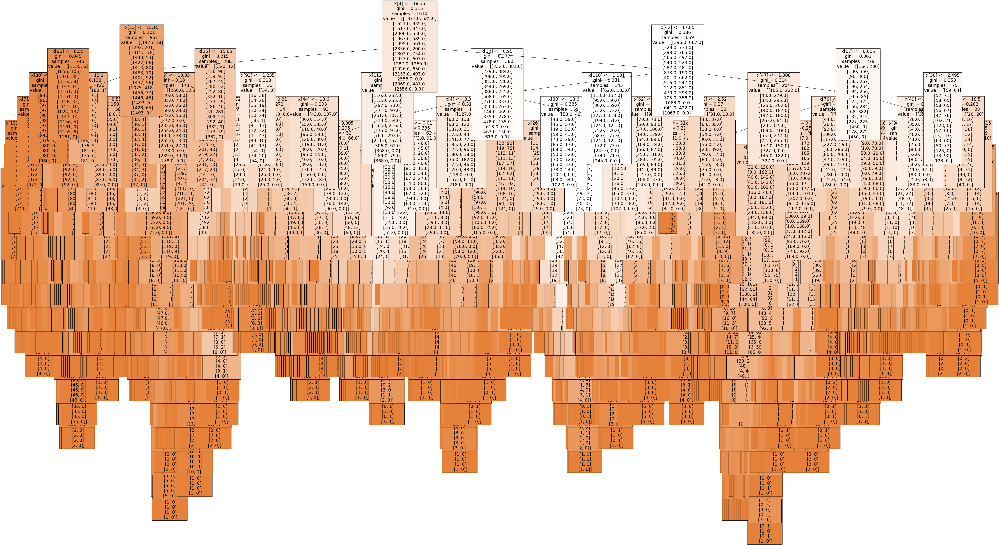

In [31]:
# Define the labels
labels = ['pleasant', 'unpleasant']

fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[22], fontsize = 20, class_names=labels, filled=True);

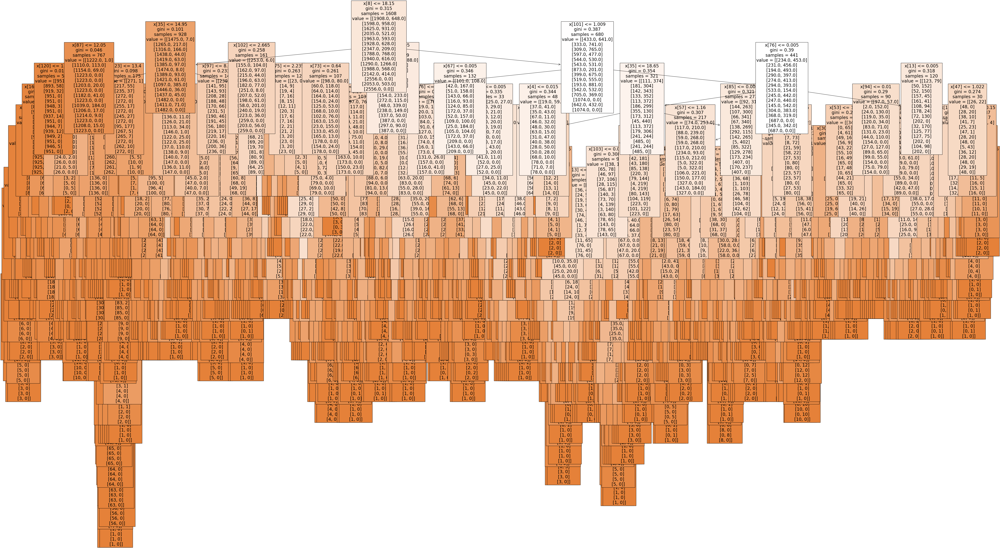

In [32]:
fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[99], fontsize = 20, class_names=labels, filled=True);

### 3.5 Feature importance

In [34]:
# Extract feature importances
important = clf.feature_importances_

# Reshape feature importances
important_reshaped = important.reshape(-1, 15, 9)

# Combine into one observation for each weather station
weather_station_importance = np.sum(important_reshaped, axis=2).flatten()

# Verify the shape to confirm it is now (15,)
print(weather_station_importance.shape)  # Should print (15,)

print("Weather station importances:\n", weather_station_importance)

(15,)
Weather station importances:
 [0.10070613 0.05323845 0.0570739  0.08687095 0.10899652 0.06619049
 0.03040334 0.07932493 0.1109789  0.06934355 0.08104577 0.05654503
 0.0359268  0.05907394 0.0042813 ]


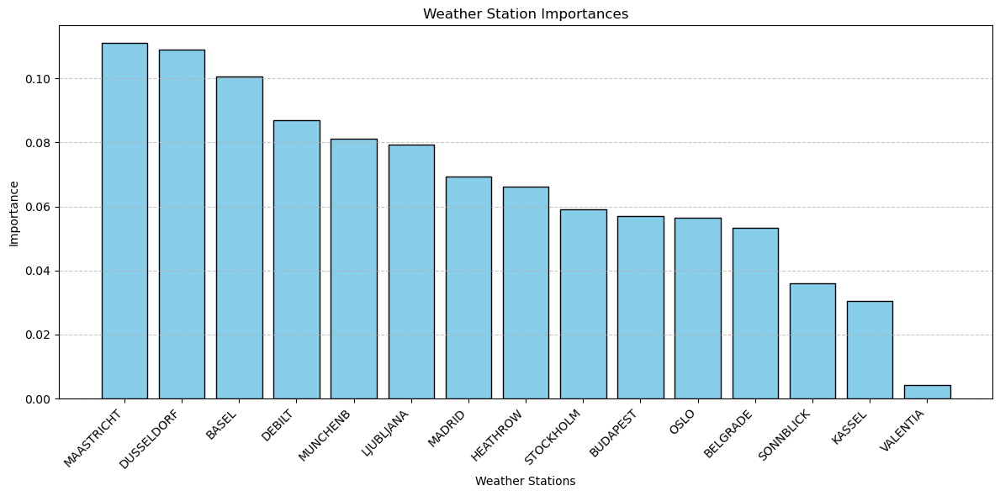

In [146]:
# Weather stations list
weather_stations = ['BASEL', 'BELGRADE', 'BUDAPEST', 'DEBILT', 'DUSSELDORF', 'HEATHROW', 
                    'KASSEL', 'LJUBLJANA', 'MAASTRICHT', 'MADRID', 'MUNCHENB', 'OSLO', 'SONNBLICK', 
                    'STOCKHOLM', 'VALENTIA']

# Pair weather stations with their importances and sort by importance descending
sorted_data = sorted(zip(weather_stations, weather_station_importance), key=lambda x: x[1], reverse=True)

# Unpack sorted data back into lists
sorted_weather_stations, sorted_importance = zip(*sorted_data)

# Plot the bar chart
plt.figure(figsize=(12, 6))
plt.bar(sorted_weather_stations, sorted_importance, color='skyblue', edgecolor='black')
plt.xticks(rotation=45, ha='right') 
plt.grid(True, axis='y', linestyle='--', alpha=0.7) 
plt.ylabel('Importance')
plt.xlabel('Weather Stations')
plt.title('Weather Station Importances')
plt.tight_layout()  # Prevent overlap of elements
plt.show()

## 4. Random forest on every year with top 3 most influential weather stations

In [37]:
df_weather.head() 

,DATE,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,...,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,1960-01-01,7,0.85,1.018,0.32,0.09,0.7,6.5,0.8,10.9,...,4.9,5,0.88,1.0003,0.45,0.34,4.7,8.5,6.0,10.9
1,1960-01-02,6,0.84,1.018,0.36,1.05,1.1,6.1,3.3,10.1,...,5.0,7,0.91,1.0007,0.25,0.84,0.7,8.9,5.6,12.1
2,1960-01-03,8,0.90,1.018,0.18,0.30,0.0,8.5,5.1,9.9,...,4.1,7,0.91,1.0096,0.17,0.08,0.1,10.5,8.1,12.9
3,1960-01-04,3,0.92,1.018,0.58,0.00,4.1,6.3,3.8,10.6,...,2.3,7,0.86,1.0184,0.13,0.98,0.0,7.4,7.3,10.6
4,1960-01-05,6,0.95,1.018,0.65,0.14,5.4,3.0,-0.7,6.0,...,4.3,3,0.80,1.0328,0.46,0.00,5.7,5.7,3.0,8.4


In [38]:
df_pleasant.head()

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
0,1960-01-01,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1960-01-02,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1960-01-03,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,1960-01-04,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1960-01-05,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


### 4.1 Create separate DataFrames for specific weather stations based on column names.

In [40]:
# Create separate DataFrames for specific weather stations based on column names.

def create_station_dataframes(df, station_names):

    station_dataframes = {}

    for station in station_names:
        # Filter columns that contain the station name
        matching_columns = [col for col in df.columns if station in col]
        # Create a new DataFrame for the station
        station_dataframes[station] = df[matching_columns].copy()

    return station_dataframes

station_names = ['MAASTRICHT_', 'DUSSELDORF_', 'BASEL_']

# Apply the function to df_weather
station_dataframes_weather = create_station_dataframes(df_weather, station_names)

# Extract the individual dataframes for weather (X)
df_maastricht = station_dataframes_weather['MAASTRICHT_']
df_dusseldorf = station_dataframes_weather['DUSSELDORF_']
df_basel = station_dataframes_weather['BASEL_']

# Apply the function to df_pleasant
station_dataframes_pleasant = create_station_dataframes(df_pleasant, station_names)

# Extract the individual DataFrames for df_pleasant
df_pleasant_maastricht = station_dataframes_pleasant['MAASTRICHT_']
df_pleasant_dusseldorf = station_dataframes_pleasant['DUSSELDORF_']
df_pleasant_basel = station_dataframes_pleasant['BASEL_']

In [41]:
df_maastricht.shape

(22950, 9)

In [42]:
df_pleasant_maastricht.shape

(22950, 1)

In [43]:
df_dusseldorf.shape

(22950, 9)

In [44]:
df_pleasant_dusseldorf.shape

(22950, 1)

In [45]:
df_basel.shape

(22950, 9)

In [46]:
df_pleasant_basel.shape

(22950, 1)

In [47]:
df_maastricht.head()

,MAASTRICHT_cloud_cover,MAASTRICHT_humidity,MAASTRICHT_pressure,MAASTRICHT_global_radiation,MAASTRICHT_precipitation,MAASTRICHT_sunshine,MAASTRICHT_temp_mean,MAASTRICHT_temp_min,MAASTRICHT_temp_max
0,7,0.83,1.0063,0.22,0.32,1.0,9.5,8.5,11.1
1,8,0.92,1.0062,0.17,1.34,0.4,8.6,7.5,9.9
2,7,0.97,1.0167,0.12,0.46,0.0,6.9,5.5,9.9
3,7,0.89,1.0277,0.16,0.00,0.3,7.0,3.0,10.0
4,7,0.92,1.0259,0.12,0.56,0.0,8.1,2.5,11.1


In [48]:
df_dusseldorf.head()

,DUSSELDORF_cloud_cover,DUSSELDORF_humidity,DUSSELDORF_pressure,DUSSELDORF_global_radiation,DUSSELDORF_precipitation,DUSSELDORF_sunshine,DUSSELDORF_temp_mean,DUSSELDORF_temp_min,DUSSELDORF_temp_max
0,8,0.83,1.0161,0.12,0.08,0.0,10.0,7.0,11.5
1,8,0.89,1.0161,0.18,0.66,0.5,8.2,7.4,11.0
2,7,0.95,1.0161,0.12,0.07,0.0,7.1,6.9,9.1
3,8,0.86,1.0161,0.12,0.02,0.0,6.8,3.6,8.0
4,7,0.92,1.0161,0.12,0.62,0.0,7.7,6.2,11.0


In [49]:
df_basel.head()

,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max
0,7,0.85,1.018,0.32,0.09,0.7,6.5,0.8,10.9
1,6,0.84,1.018,0.36,1.05,1.1,6.1,3.3,10.1
2,8,0.90,1.018,0.18,0.30,0.0,8.5,5.1,9.9
3,3,0.92,1.018,0.58,0.00,4.1,6.3,3.8,10.6
4,6,0.95,1.018,0.65,0.14,5.4,3.0,-0.7,6.0


### 4.2 Maastricht

In [51]:
#Split data into training and testing sets.
X1_train, X1_test, y1_train, y1_test = train_test_split(df_maastricht, df_pleasant_maastricht, test_size=0.3, random_state=42)

In [52]:
print(X1_train.shape, y1_train.shape)
print(X1_test.shape, y1_test.shape)

(16065, 9) (16065, 1)
(6885, 9) (6885, 1)


In [53]:
# creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100, max_depth=None)  
  
# Train the model on the training dataset
clf.fit(X1_train, y1_train)

C:\Users\ashle\anaconda3\Lib\site-packages\sklearn\base.py:1474: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


RandomForestClassifier()

In [54]:
# Perform predictions on the test dataset
y1_pred = clf.predict(X1_test)
  
# Print model accuracy
print("Model Accuracy: ", metrics.accuracy_score(y1_test, y1_pred))

# Print the classification report
print("\nClassification Report:\n")
print(classification_report(y1_test, y1_pred))

Model Accuracy:  1.0

Classification Report:

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5465
           1       1.00      1.00      1.00      1420

    accuracy                           1.00      6885
   macro avg       1.00      1.00      1.00      6885
weighted avg       1.00      1.00      1.00      6885



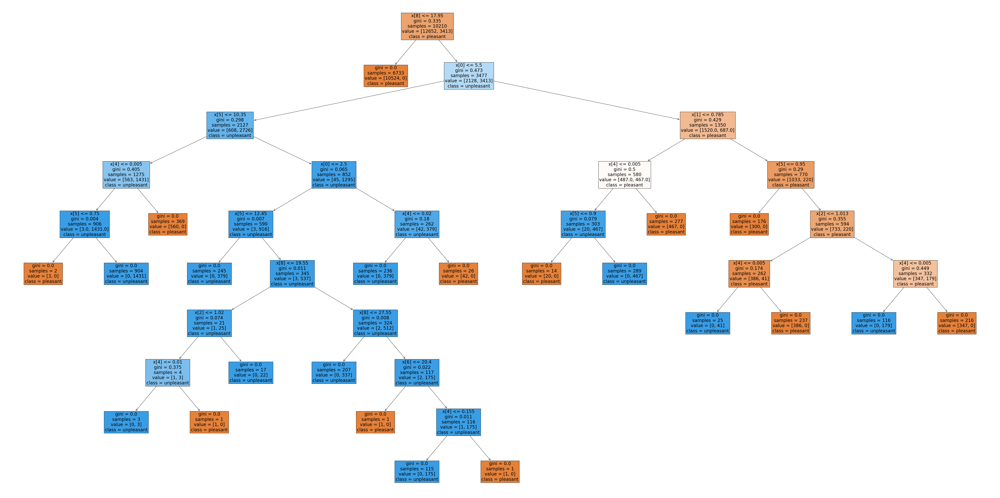

In [55]:
# Define the labels
labels = ['pleasant', 'unpleasant']

fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[38], fontsize = 20, class_names=labels, filled=True);

In [56]:
# Extract feature importances
important = clf.feature_importances_

print("Maastricht importances:\n", important)

Maastricht importances:
 [0.03177929 0.02490831 0.01418977 0.08780232 0.3235781  0.07730897
 0.12897523 0.01851987 0.29293814]


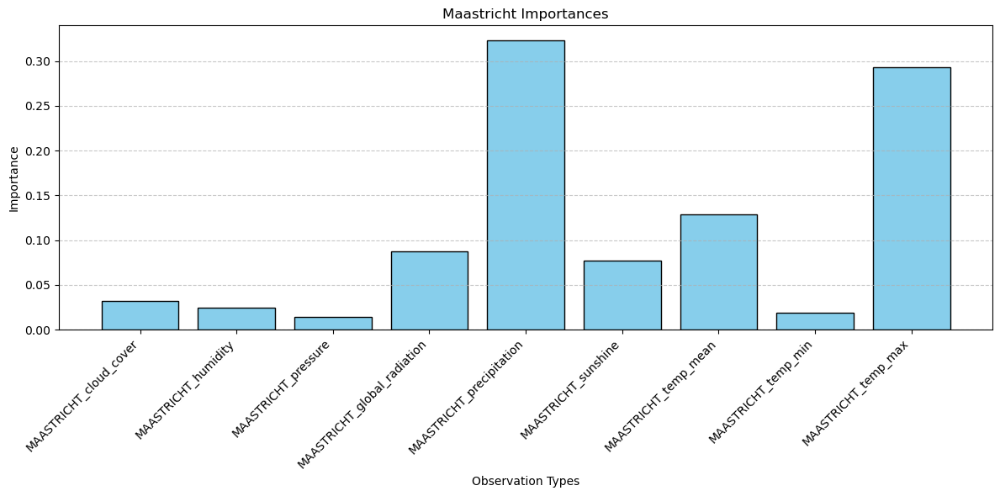

In [57]:
# Weather stations list
observation_types = ['MAASTRICHT_cloud_cover', 'MAASTRICHT_humidity', 'MAASTRICHT_pressure', 'MAASTRICHT_global_radiation',	'MAASTRICHT_precipitation', 'MAASTRICHT_sunshine', 'MAASTRICHT_temp_mean', 'MAASTRICHT_temp_min', 'MAASTRICHT_temp_max']

# Plot the bar chart
plt.figure(figsize=(12, 6))
plt.bar(observation_types, important, color='skyblue', edgecolor='black')
plt.xticks(rotation=45, ha='right') 
plt.grid(True, axis='y', linestyle='--', alpha=0.7) 
plt.ylabel('Importance')
plt.xlabel('Observation Types')
plt.title('Maastricht Importances')
plt.tight_layout() 
plt.show()

### 4.2 Dusseldorf

In [59]:
#Split data into training and testing sets.
X2_train, X2_test, y2_train, y2_test = train_test_split(df_dusseldorf, df_pleasant_dusseldorf, test_size=0.3, random_state=42)

In [60]:
print(X2_train.shape, y2_train.shape)
print(X2_test.shape, y2_test.shape)

(16065, 9) (16065, 1)
(6885, 9) (6885, 1)


In [61]:
# creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100, max_depth=None)  
  
# Train the model on the training dataset
clf.fit(X2_train, y2_train)

C:\Users\ashle\anaconda3\Lib\site-packages\sklearn\base.py:1474: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


RandomForestClassifier()

In [62]:
# Perform predictions on the test dataset
y2_pred = clf.predict(X2_test)
  
# Print model accuracy
print("Model Accuracy: ", metrics.accuracy_score(y2_test, y2_pred))

# Print the classification report
print("\nClassification Report:\n")
print(classification_report(y2_test, y2_pred))

Model Accuracy:  1.0

Classification Report:

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5409
           1       1.00      1.00      1.00      1476

    accuracy                           1.00      6885
   macro avg       1.00      1.00      1.00      6885
weighted avg       1.00      1.00      1.00      6885



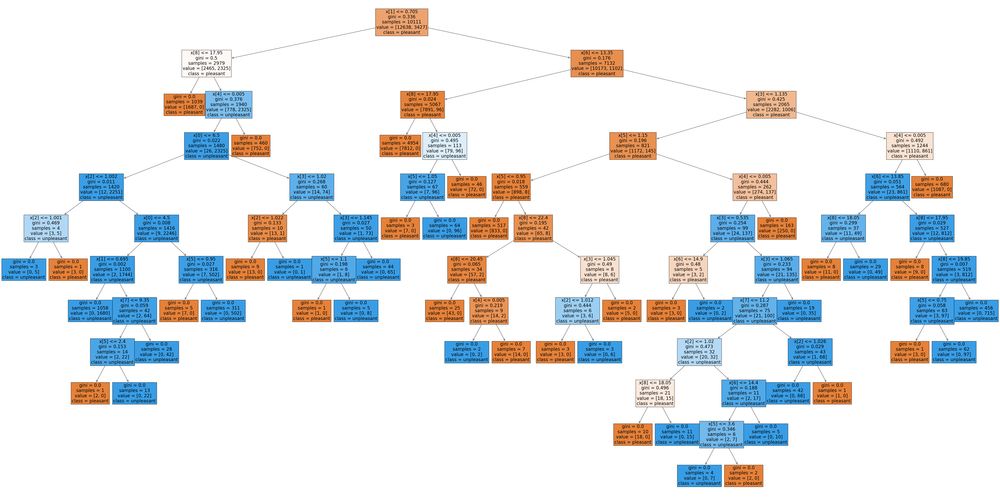

In [63]:
# Define the labels
labels = ['pleasant', 'unpleasant']

fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[72], fontsize = 20, class_names=labels, filled=True);

In [64]:
# Extract feature importances
important = clf.feature_importances_

print('Dusseldorf importances:\n', important)

Dusseldorf importances:
 [0.03063846 0.0256245  0.00993715 0.10294732 0.34547865 0.0815394
 0.10812567 0.01869497 0.27701388]


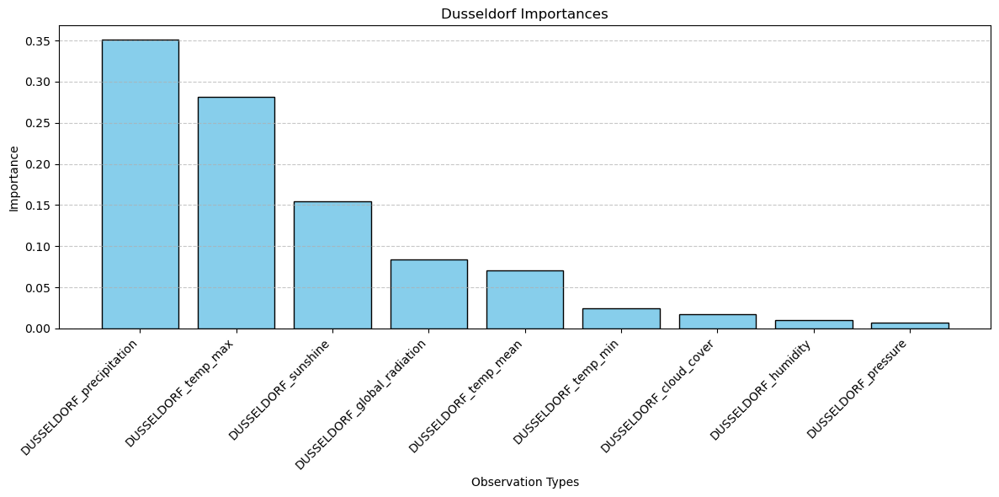

In [150]:
# Weather stations list
observation_types = ['DUSSELDORF_cloud_cover', 'DUSSELDORF_humidity', 'DUSSELDORF_pressure', 'DUSSELDORF_global_radiation',	'DUSSELDORF_precipitation', 'DUSSELDORF_sunshine', 'DUSSELDORF_temp_mean', 'DUSSELDORF_temp_min', 'DUSSELDORF_temp_max']

# Pair observation types with their importance values and sort by importance descending
sorted_data = sorted(zip(observation_types, important), key=lambda x: x[1], reverse=True)

# Unpack sorted data back into two lists
sorted_observation_types, sorted_importance = zip(*sorted_data)

# Plot the bar chart
plt.figure(figsize=(12, 6))
plt.bar(sorted_observation_types, sorted_importance, color='skyblue', edgecolor='black')
plt.xticks(rotation=45, ha='right') 
plt.grid(True, axis='y', linestyle='--', alpha=0.7) 
plt.ylabel('Importance')
plt.xlabel('Observation Types')
plt.title('Dusseldorf Importances')
plt.tight_layout() 
plt.show()

### 4.3 Basel

In [67]:
#Split data into training and testing sets.
X3_train, X3_test, y3_train, y3_test = train_test_split(df_basel, df_pleasant_ba   sel, test_size=0.3, random_state=42)

In [68]:
print(X3_train.shape, y3_train.shape)
print(X3_test.shape, y3_test.shape)

(16065, 9) (16065, 1)
(6885, 9) (6885, 1)


In [69]:
# creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100, max_depth=None)  
  
# Train the model on the training dataset
clf.fit(X3_train, y3_train)

C:\Users\ashle\anaconda3\Lib\site-packages\sklearn\base.py:1474: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


RandomForestClassifier()

In [70]:
# Perform predictions on the test dataset
y3_pred = clf.predict(X3_test)
  
# Print model accuracy
print("Model Accuracy: ", metrics.accuracy_score(y3_test, y3_pred))

# Print the classification report
print("\nClassification Report:\n")
print(classification_report(y3_test, y3_pred))

Model Accuracy:  1.0

Classification Report:

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5184
           1       1.00      1.00      1.00      1701

    accuracy                           1.00      6885
   macro avg       1.00      1.00      1.00      6885
weighted avg       1.00      1.00      1.00      6885



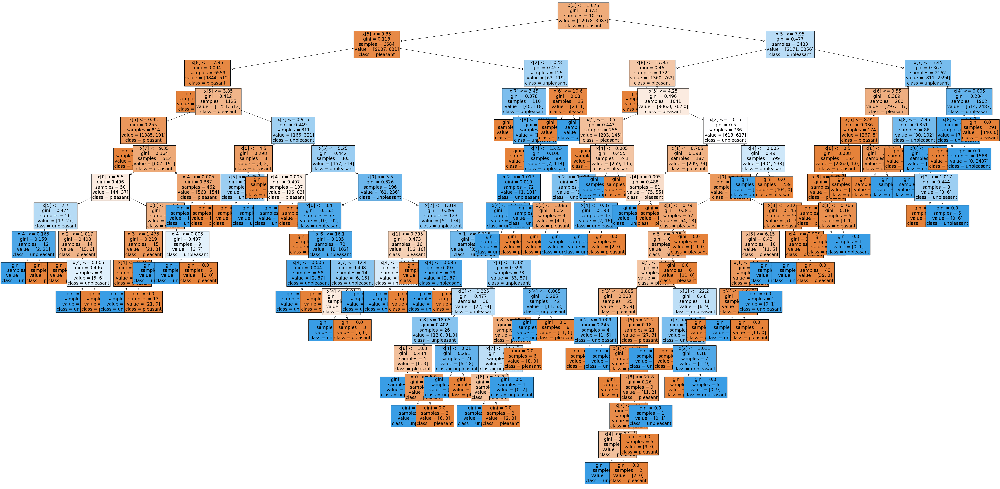

In [71]:
# Define the labels
labels = ['pleasant', 'unpleasant']

fig = plt.figure(figsize=(80,40))
plot_tree(clf.estimators_[84], fontsize = 20, class_names=labels, filled=True);

In [72]:
# Extract feature importances
important = clf.feature_importances_

print("Basel importances:\n", important)

Basel importances:
 [0.01705073 0.01017284 0.00746683 0.08399594 0.35057411 0.15395195
 0.07096186 0.02484954 0.28097619]


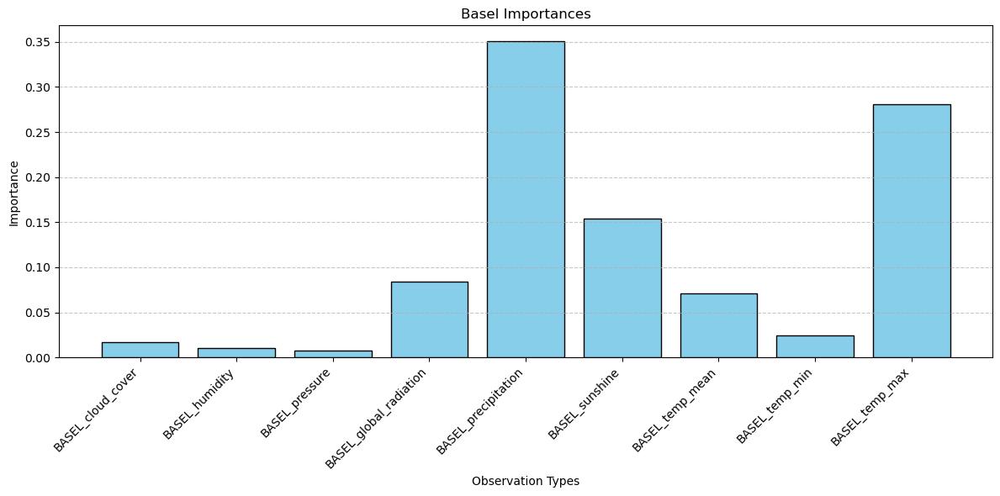

In [73]:
# Weather stations list
observation_types = ['BASEL_cloud_cover', 'BASEL_humidity', 'BASEL_pressure', 'BASEL_global_radiation',	'BASEL_precipitation', 'BASEL_sunshine', 'BASEL_temp_mean', 'BASEL_temp_min', 'BASEL_temp_max']

# Plot the bar chart
plt.figure(figsize=(12, 6))
plt.bar(observation_types, important, color='skyblue', edgecolor='black')
plt.xticks(rotation=45, ha='right') 
plt.grid(True, axis='y', linestyle='--', alpha=0.7) 
plt.ylabel('Importance')
plt.xlabel('Observation Types')
plt.title('Basel Importances')
plt.tight_layout() 
plt.show()

In [142]:
# Export data

df_maastricht.to_csv(os.path.join(path, '02 Data Sets', 'maastricht_data_all_years.csv'), index = False)
df_pleasant_maastricht.to_csv(os.path.join(path, '02 Data Sets', 'maastricht_pleasant_all_years.csv'), index = False)

df_dusseldorf.to_csv(os.path.join(path, '02 Data Sets', 'dusseldorf_data_all_years.csv'), index = False)
df_pleasant_dusseldorf.to_csv(os.path.join(path, '02 Data Sets', 'dusseldorf_pleasant_all_years.csv'), index = False)

df_basel.to_csv(os.path.join(path, '02 Data Sets', 'basel_data_all_years.csv'), index = False)
df_pleasant_basel.to_csv(os.path.join(path, '02 Data Sets', 'basel_pleasant_all_years.csv'), index = False)